# OpenRAM Playground
[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://githubtocolab.com/VLSIDA/OpenRAM/blob/patch-colab/docs/source/OpenRAM.ipynb)

Authored by Farhad Modaresi

# 1. Install OpenRAM and its dependancies


In [1]:
# Clone OpenRAM version 1.2.8:
! cd $HOME && git clone -b v1.2.8 https://github.com/VLSIDA/OpenRAM > /dev/null 2>&1

# Run the install_conda.sh script which installs the following tools using anaconda:
# Miniconda, litex-hub, iverilog, VLSIDA-EDA (klayout, magic, netgen, ngspice, trilinos, xyce)
! cd $HOME/OpenRAM && ./install_conda.sh > /dev/null 2>&1

# Set environment variables used by the OpenRAM compiler and related tools to 
# locate and use various files and libraries needed for the design and 
# simulation of SRAM cells:
%env OPENRAM_ROOT=/root/OpenRAM
%env OPENRAM_HOME="/root/OpenRAM/compiler"
%env OPENRAM_TECH="/root/OpenRAM/technology"
%env PYTHONPATH=$OPENRAM_HOME
%env PYTHONPATH="$OPENRAM_HOME:$OPENRAM_TECH/sky130:$OPENRAM_TECH/sky130/custom"

# Download and set up SKY130 PDK (spice, GDS, magic, etc. libraries)
! source /root/OpenRAM/miniconda/bin/activate && cd $HOME/OpenRAM && make pdk > /dev/null 2>&1

# Download and set up the SKY130 SRAM build space which has the necessary 
# components for OpenRAM to compile SRAM macros
! cd $HOME/OpenRAM && make install > /dev/null 2>&1

env: OPENRAM_ROOT="/root/OpenRAM"
env: OPENRAM_HOME="/root/OpenRAM/compiler"
env: OPENRAM_TECH="/root/OpenRAM/technology"
env: PYTHONPATH=$OPENRAM_HOME
env: PYTHONPATH="$OPENRAM_HOME:$OPENRAM_TECH/sky130:$OPENRAM_TECH/sky130/custom"


# 4. Install GDS viewers

In [13]:
# 2D View:
# Install Gdstk (GDSII Tool Kit) to convert gds to svg:
! pip install gdstk > /dev/null 2>&1
# Install Imagemagick and its dependencies to convert svg into png
! apt update && apt install imagemagick fonts-freefont-otf ghostscript fonts-freefont-ttf inkscape > /dev/null 2>&1

# 3D View:
# Install Python3 GDS to glTF files converter script made by Maximo
!cd $HOME && git clone https://github.com/mbalestrini/GDS2glTF.git > /dev/null 2>&1
!cd $HOME && python -m pip install -r GDS2glTF/requirements.txt > /dev/null 2>&1

# Install glTF HTML viewer made by Johan Euphrosine (Proppy)
!git clone https://github.com/proppy/gds_viewer.git > /dev/null 2>&1
import jinja2
gds_viewer = jinja2.Environment(loader=jinja2.FileSystemLoader('gds_viewer')).get_template('viewer.html') 

Hit:1 https://cloud.r-project.org/bin/linux/ubuntu focal-cran40/ InRelease
Hit:2 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2004/x86_64  InRelease
Hit:3 http://archive.ubuntu.com/ubuntu focal InRelease
Hit:4 http://archive.ubuntu.com/ubuntu focal-updates InRelease
Hit:5 http://archive.ubuntu.com/ubuntu focal-backports InRelease
Hit:6 http://security.ubuntu.com/ubuntu focal-security InRelease
Hit:7 http://ppa.launchpad.net/c2d4u.team/c2d4u4.0+/ubuntu focal InRelease
Hit:8 http://ppa.launchpad.net/cran/libgit2/ubuntu focal InRelease
Hit:9 http://ppa.launchpad.net/deadsnakes/ppa/ubuntu focal InRelease
Hit:10 http://ppa.launchpad.net/graphics-drivers/ppa/ubuntu focal InRelease
Hit:11 http://ppa.launchpad.net/ubuntugis/ppa/ubuntu focal InRelease
Reading package lists... Done
Building dependency tree       
Reading state information... Done
23 packages can be upgraded. Run 'apt list --upgradable' to see them.


# SRAM Cells:
Left: Single port
Right: Dual port

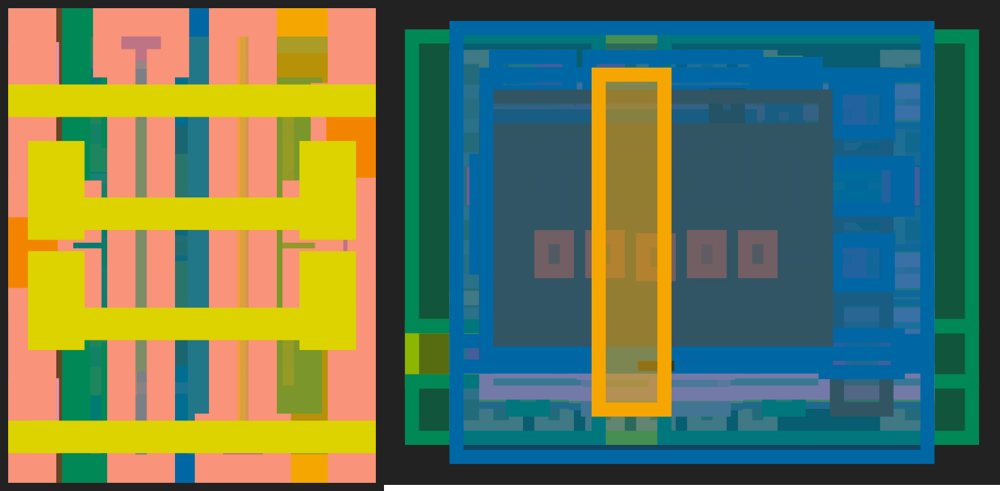

In [11]:
#@title
sp = "/root/OpenRAM/technology/sky130/gds_lib/sky130_fd_bd_sram__sram_sp_cell_opt1.gds"
import gdstk
from IPython.display import Image
library = gdstk.read_gds(sp)
top_cells = library.top_level()
top_cells[0].write_svg(f'sp.svg')
! convert -density 4000 sp.svg sp.png > /dev/null 2>&1
dp = "/root/OpenRAM/technology/sky130/gds_lib/sky130_fd_bd_sram__openram_dp_cell.gds"
library = gdstk.read_gds(dp)
top_cells = library.top_level()
top_cells[0].write_svg(f'dp.svg')
! convert -density 2000 dp.svg dp.png > /dev/null 2>&1
! convert +append sp.png dp.png merged.png > /dev/null 2>&1
Image("merged.png", width=1000)

# 2. Macro specifications:
Defines the SRAM macro specifications.

In [4]:
#@title
config_file = "/root/OpenRAM/macros/sram_configs/sky130_sram_1rw1r_tiny.py"
#@markdown ---
#@markdown ### Number of bits for each memory word:
word_size = 8 #@param {type:"raw"}
#@markdown ---
#@markdown ### Total number of memory words:
num_words = 16 #@param {type:"raw"}
#@markdown ---
#@markdown ### Lowest number of writable bits in one write cylce:
write_size = 2 #@param {type:"raw"}
#@markdown ---
#@markdown ### Number of Read/Write ports:
num_rw_ports = 1 #@param {type:"raw"}
#@markdown ---
#@markdown ### Number of Read only ports:
num_r_ports = 1 #@param {type:"raw"}
#@markdown ---
#@markdown ### Number of Write only ports:
num_w_ports = 0 #@param {type:"raw"}
#@markdown ---



! sed -i "s/^word_size.*$/word_size = $word_size/" $config_file 
! sed -i "s/^num_words.*$/num_words = $num_words/" $config_file 
! sed -i "s/^write_size.*$/write_size = $write_size/" $config_file 
! sed -i "s/^num_rw_ports.*$/num_rw_ports = $num_rw_ports/" $config_file 
! sed -i "s/^num_r_ports.*$/num_r_ports = $num_r_ports/" $config_file 
! sed -i "s/^num_w_ports.*$/num_w_ports = $num_w_ports/" $config_file 
! sed -i "s/^FIXME.*$//" $config_file 


# ! cat /root/OpenRAM/macros/sram_configs/sky130_sram_1rw1r_tiny.py

# 3. Compile the SRAM macro for SKY130 using the above specs:


In [19]:
! cd /root/OpenRAM/macros/ && make sky130_sram_1rw1r_tiny.ok > /dev/null 2>&1

# 5. 2D GDS view:

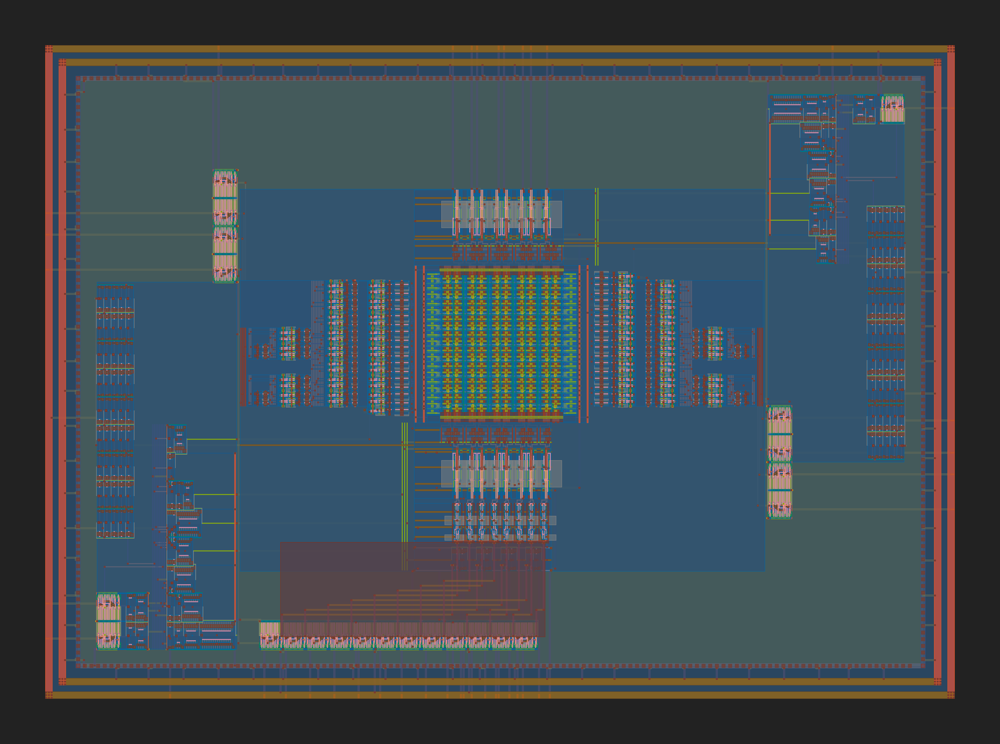

In [17]:
#@title
import gdstk
# from IPython.display import SVG
from IPython.display import Image

gds = "/root/OpenRAM/macros/sky130_sram_1rw1r_tiny/sky130_sram_1rw1r_tiny.gds"
library = gdstk.read_gds(gds)
top_cells = library.top_level()
top_cells[0].write_svg(f'spm.svg')
! rm spm.png
! convert -density 280 spm.svg spm.png
# ! inkscape -z -f spm.svg -w 1000 -j -e spm.png 
Image("spm.png", width=1500)
# SVG(f'spm.svg')

# 6. 3D GDS View

In [7]:
#@title
import pathlib

gds = "/root/OpenRAM/macros/sky130_sram_1rw1r_tiny/sky130_sram_1rw1r_tiny.gds"
!cd $HOME && python3 GDS2glTF/gds2gltf.py /root/OpenRAM/macros/sky130_sram_1rw1r_tiny/sky130_sram_1rw1r_tiny.gds | tee gds2gltf.log
import IPython.display
IPython.display.clear_output(wait=True)
with open(f'{gds}.gltf') as f:
  gltf_data=f.read()
  output = gds_viewer.render(gltf_data=gltf_data)
IPython.display.HTML(output)